In [1]:
import numpy as np
import scipy as spi
import skimage as ski

import matplotlib.pyplot as plt
import matplotlib.patches as patches

import torch

In [2]:
from torchvision.io import read_image
from torchvision.models.segmentation import fcn_resnet50, FCN_ResNet50_Weights

# Lets segment this image

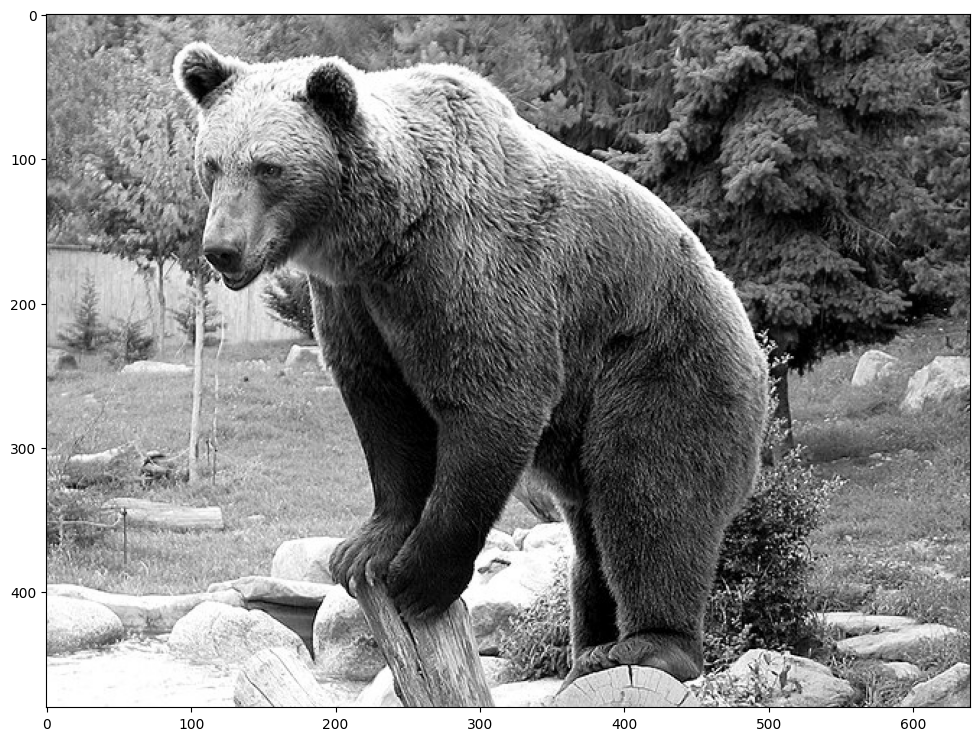

In [3]:
img = ski.io.imread("img/bear.jpg")
gray = ski.color.rgb2gray(img)
plt.figure(figsize=(16, 9))
plt.imshow(gray, cmap="gray", vmin=0, vmax=1);

## Maybe the intensity can help us?

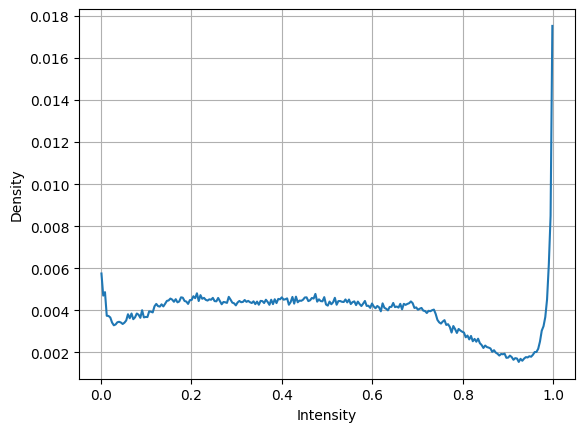

In [4]:
hist, hist_centers = ski.exposure.histogram(gray, normalize=True)

plt.plot(hist_centers, hist,)
plt.xlabel("Intensity")
plt.ylabel("Density");
plt.grid();

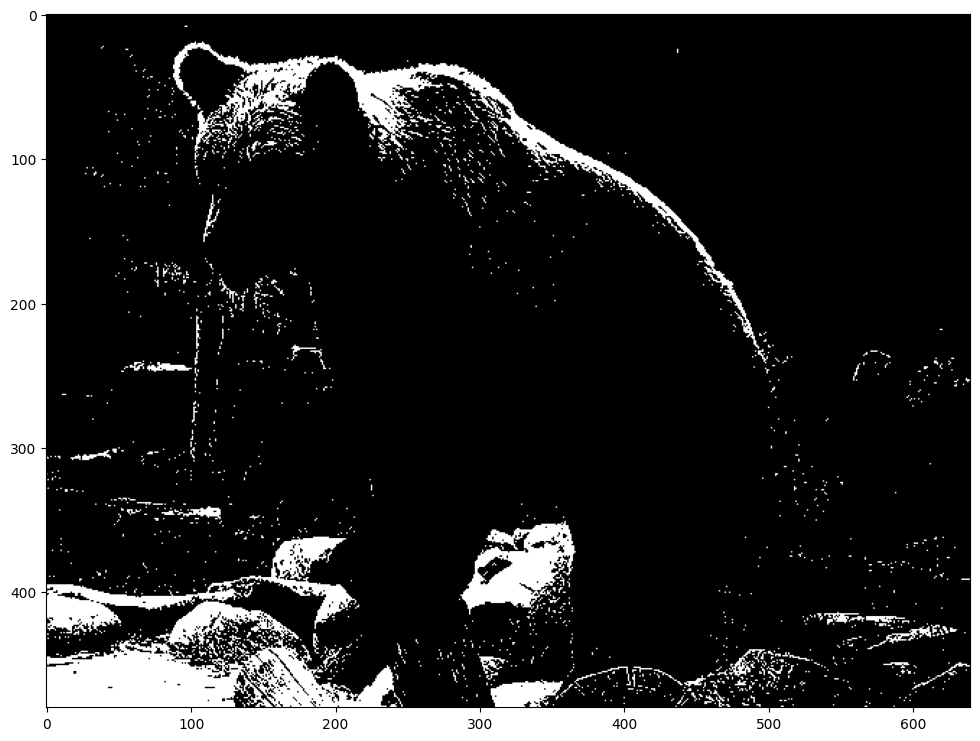

In [5]:
plt.figure(figsize=(16, 9))
plt.imshow(gray > 0.9,  cmap="gray", vmin=0, vmax=1);

## What about edges?

We'll apply a gradient operator on the image

In [6]:
edges = ski.filters.sobel(gray)

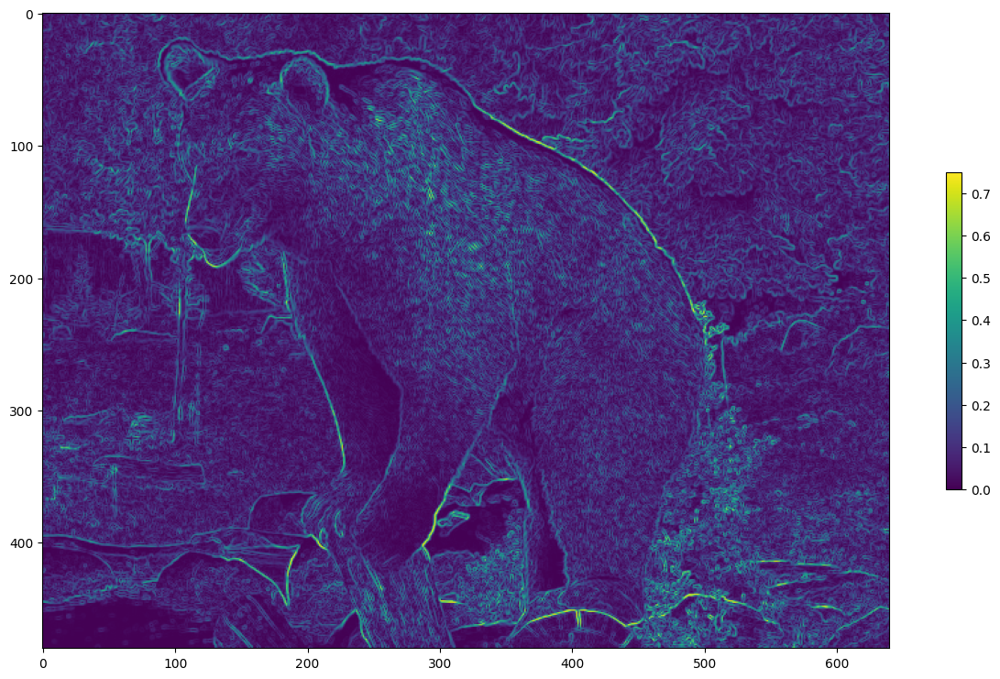

In [7]:
plt.figure(figsize=(16, 9))
#plt.imshow(gray, cmap="gray", vmin=0, vmax=1);
plt.imshow(edges, alpha=1)
plt.colorbar(shrink=0.5)

Lets ``waterfill'' the edges.

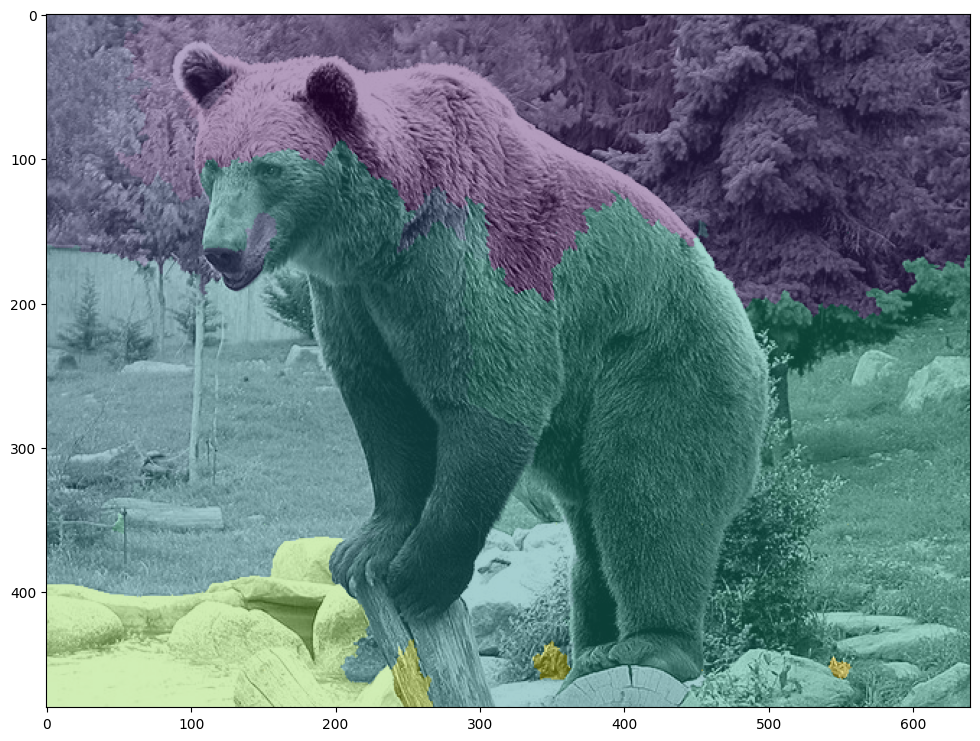

In [8]:
fill = ski.segmentation.watershed(edges, markers=30)
plt.figure(figsize=(16, 9))
plt.imshow(gray, cmap="gray", vmin=0, vmax=1);
plt.imshow(fill, alpha=0.4)

E se usarmos as cores?

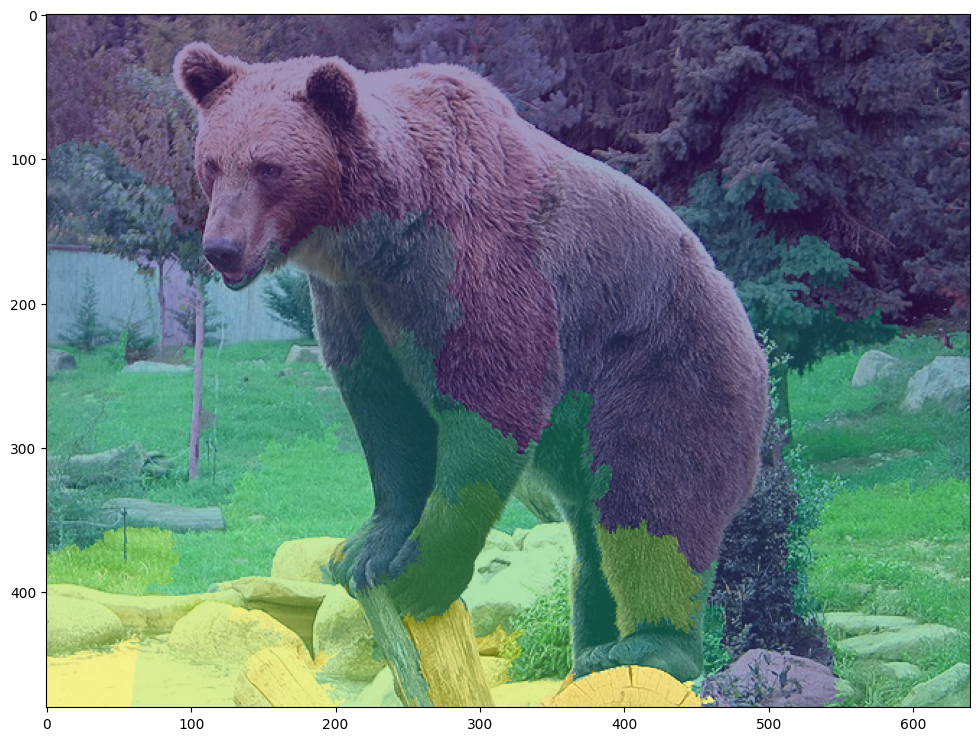

In [9]:
res = ski.segmentation.slic(img)
plt.figure(figsize=(16, 9))
plt.imshow(img, cmap="gray", vmin=0, vmax=1);
#plt.imshow(res, alpha=0.5)
plt.imshow(res, alpha=0.5)

## E usando deep learning?

In [10]:
transforms = FCN_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1.transforms(antialias=True)
model = fcn_resnet50(weights=FCN_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1).eval()
categories = FCN_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1.meta["categories"]

In [11]:
[(i, cat) for i, cat in enumerate(categories)]

[(0, '__background__'),
 (1, 'aeroplane'),
 (2, 'bicycle'),
 (3, 'bird'),
 (4, 'boat'),
 (5, 'bottle'),
 (6, 'bus'),
 (7, 'car'),
 (8, 'cat'),
 (9, 'chair'),
 (10, 'cow'),
 (11, 'diningtable'),
 (12, 'dog'),
 (13, 'horse'),
 (14, 'motorbike'),
 (15, 'person'),
 (16, 'pottedplant'),
 (17, 'sheep'),
 (18, 'sofa'),
 (19, 'train'),
 (20, 'tvmonitor')]

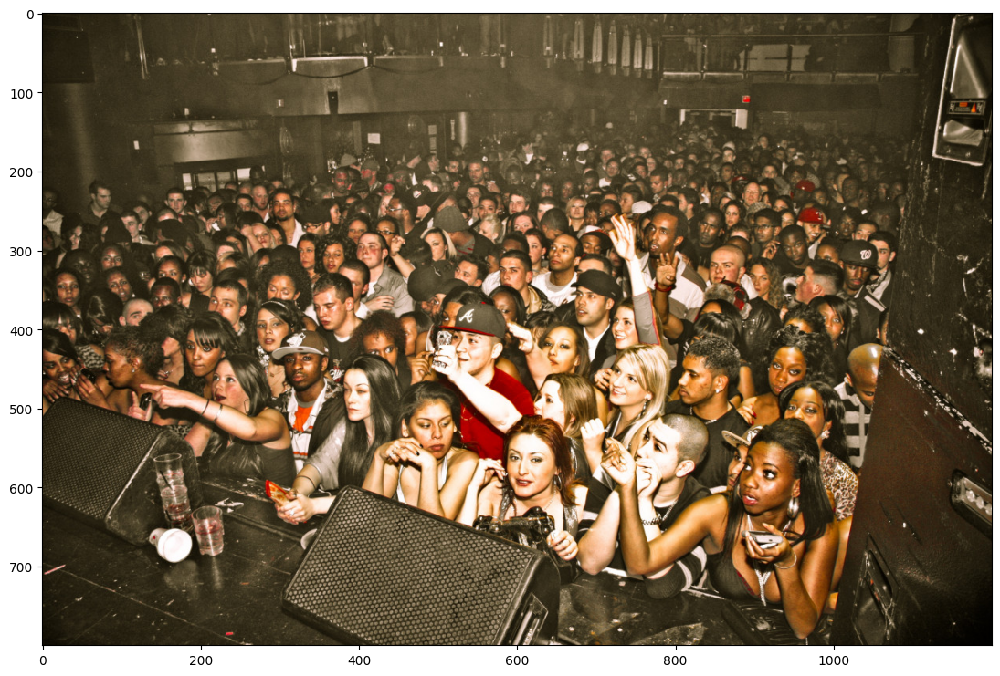

In [12]:
img = read_image("img/crowd.jpg")[None]

plt.figure(figsize=(16, 9))
plt.imshow(img[0].permute(1, 2, 0));

In [13]:
with torch.no_grad():
    results = model(transforms(img))["out"][0]
masks = results.softmax(dim=0)

/tmp/ipykernel_2524059/501614825.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


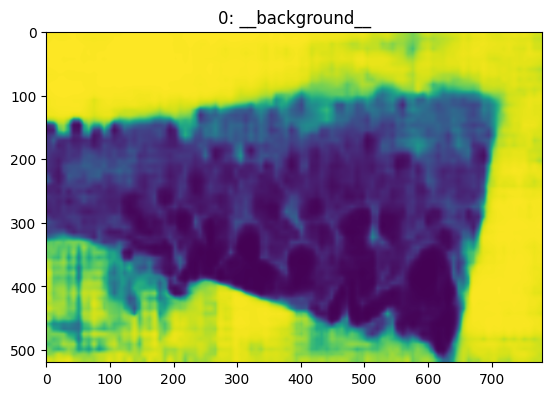

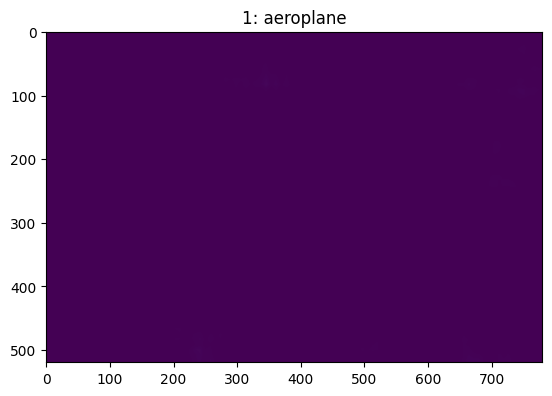

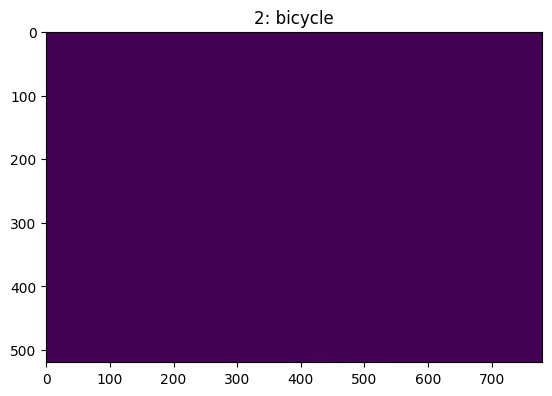

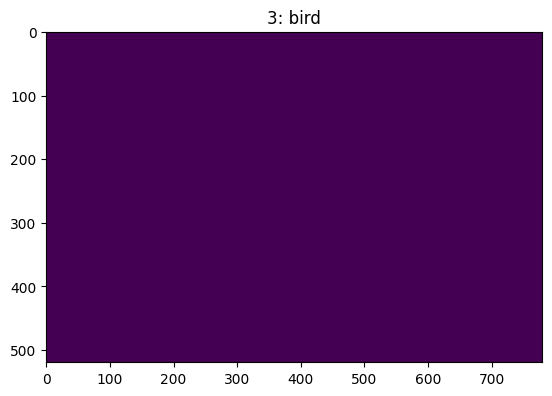

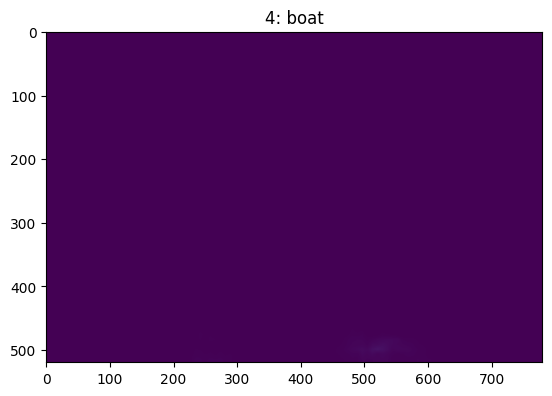

...

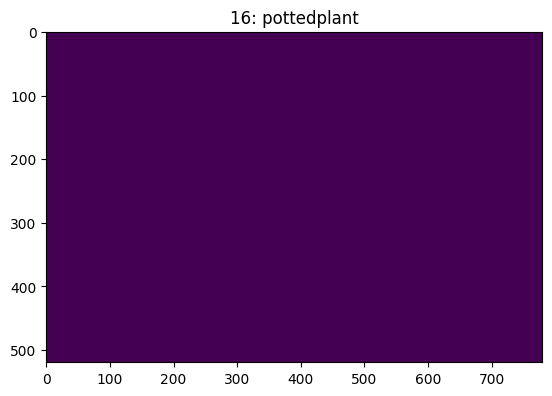

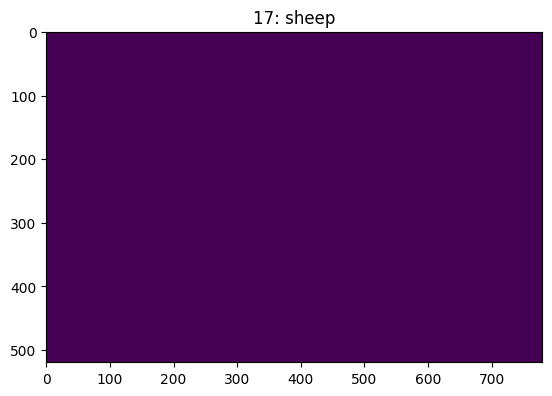

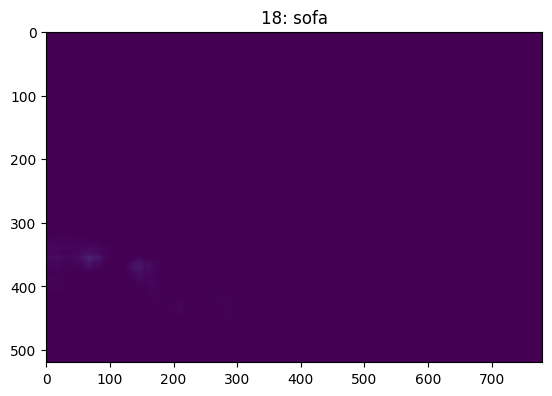

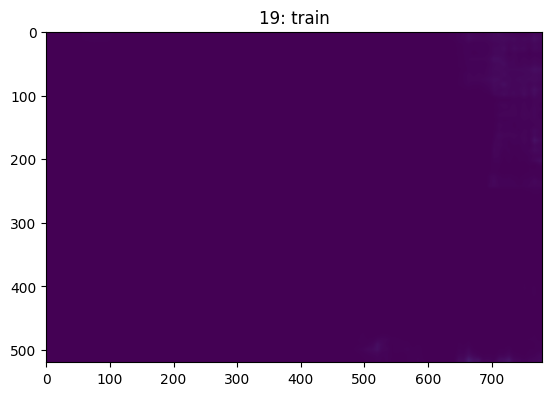

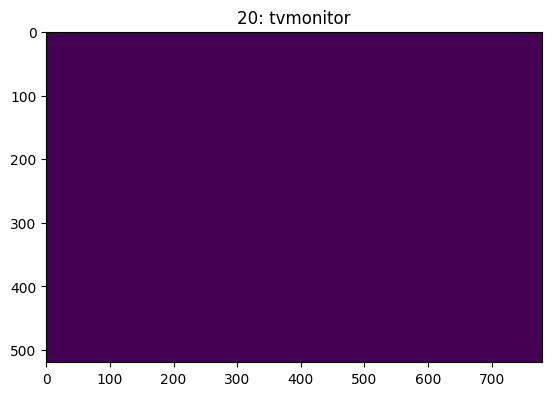

In [14]:
#fig, ax = plt.subplots(figsize=(16, 9))
for i, m in enumerate(masks):
    plt.figure()
    plt.title(f"{i}: {categories[i]}")
    plt.imshow(m, vmin=0, vmax=1);

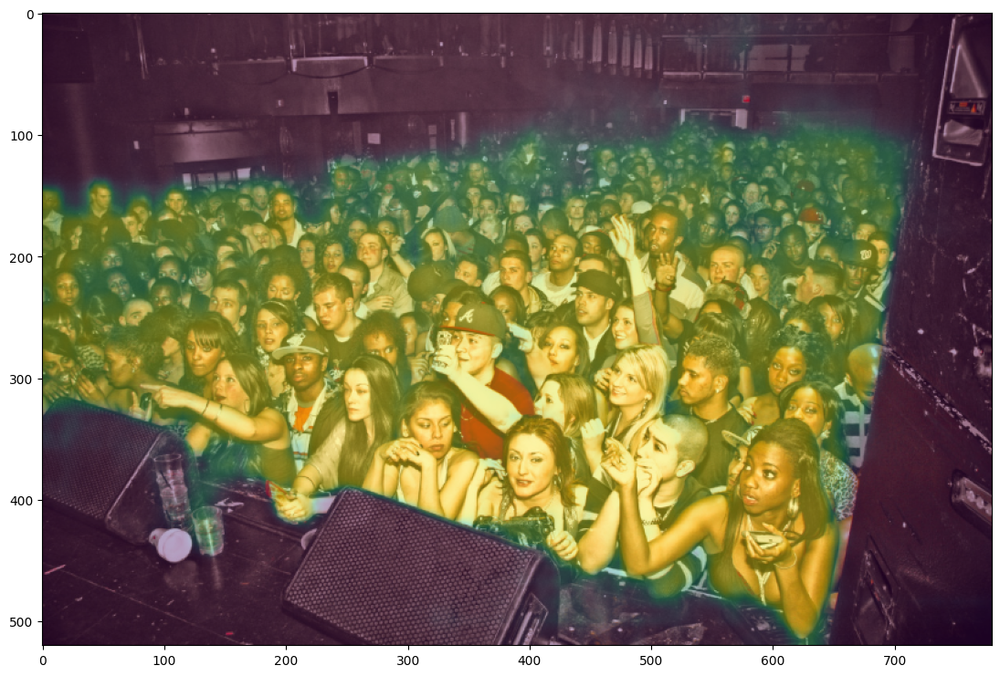

In [15]:
osize = transforms(img).shape[-2:]
img_ = img[0].permute(1, 2, 0).numpy()
img_ = ski.transform.resize(img_, osize)

fig, ax = plt.subplots(figsize=(16, 9))
ax.imshow(img_)
ax.imshow(masks[15], vmin=0, vmax=1, alpha=0.4);